In [11]:
# Kameel Khabaz and Christian Urbanek
# CMSC 25040 Final Project
# Best CycleGAN Model Code

import numpy as np
import random
import os
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision.datasets import ImageFolder
from torch.autograd import Variable
from torch.utils.data import DataLoader, Dataset
from torch.utils.data import sampler
from torchvision.utils import make_grid
import torchvision
import matplotlib.pyplot as plt
import torchvision.transforms as T
from torch.optim import lr_scheduler
import itertools

# set device
device = torch.device("mps")

In [12]:
# apply image transforms
transform = T.Compose([
    T.ToTensor()
])

# import images 
A_train = ImageFolder('../selfie2anime/trainA_main', transform = transform)
B_train = ImageFolder('../selfie2anime/trainB_main', transform = transform)

A_test = ImageFolder('../selfie2anime/testA_main', transform = transform)
B_test = ImageFolder('../selfie2anime/testB_main', transform = transform)


# create dataloaders 
def get_train_test_dataloaders(train_data, test_data, batch_size, shuffle, num_workers):
    train_loader = DataLoader(dataset = train_data, batch_size = batch_size,
                              shuffle = shuffle, num_workers = num_workers)

    test_loader = DataLoader(dataset = test_data, batch_size = batch_size,
                              shuffle = shuffle, num_workers = num_workers)
    
    return train_loader, test_loader

shuffle = True
num_workers = 0 # set to 0 to allow debugging
batch_size = 1 # size of the batches
train_A_loader, test_A_loader = get_train_test_dataloaders(A_train, A_test, \
                                        batch_size, shuffle, num_workers)

train_B_loader, test_B_loader = get_train_test_dataloaders(B_train, B_test, \
                                        batch_size, shuffle, num_workers)

In [13]:
# image data
img_height = A_test[0][0].shape[1]
img_width = A_test[0][0].shape[2]
channels = A_test[0][0].shape[0]

# functions for plotting images 
def get_images(dataset, n):
    tensors = []
    for i in range(n):
        tensors.append(dataset[i][0])
    return torch.stack(tensors)

def show_sample_images(epoch, batch):
    """show a generated sample from the test set"""
    img_A = get_images(A_test, 4)
    img_B = get_images(B_test, 4)
    G_AB.eval()
    G_BA.eval()
    real_A = img_A.to(device) 
    fake_B = G_AB(real_A).detach()
    real_B = img_B.to(device) 
    fake_A = G_BA(real_B).detach()
    # Arange images along x-axis
    real_A = make_grid(real_A, nrow=5, normalize=True)
    fake_B = make_grid(fake_B, nrow=5, normalize=True)
    real_B = make_grid(real_B, nrow=5, normalize=True)
    fake_A = make_grid(fake_A, nrow=5, normalize=True)
    # Arange images along y-axis    
    image_grid = torch.cat((real_A, fake_B, real_B, fake_A), 1)
    plt.figure(1) # plt.clf()
    plt.imshow(image_grid.cpu().permute(1,2,0))
    plt.title("Epoch " + str(epoch) + " Batch " + str(batch) + "\n Real Selfie vs Fake Anime | Real Anime vs Fake Selfie")
    plt.axis('off')
    plt.show()
    # plt.savefig("epoch" + str(epoch) + "_batch" + str(batch) + ".png", dpi = 600)


In [14]:
# training parameters 
n_epochs = 10 # number of epochs of training

# adam optimizer parameters
lr = 0.0002 # learning rate
b1 = 0.5 # decay of first order momentum of gradient
b2 = 0.999 # decay of first order momentum of gradient

In [15]:
# blocks for generator model
class EncoderBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(EncoderBlock, self).__init__()

        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, stride=2, padding=1),
            nn.InstanceNorm2d(out_ch),
            nn.LeakyReLU(0.2,inplace=True)
        )

    def forward(self, x):
        return self.block(x)
    
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()
        
        self.block = nn.Sequential(
            # reflection padding reduces boundary effects
            nn.Conv2d(in_features, in_features, 3, stride = 1, padding = 1, padding_mode="reflect"),
            nn.InstanceNorm2d(in_features), 
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(in_features, in_features, 3, stride = 1, padding = 1, padding_mode="reflect"), 
            nn.InstanceNorm2d(in_features)
        )

    def forward(self, x):
        return x + self.block(x)

class DecoderBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(DecoderBlock, self).__init__()

        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_ch, out_ch, 3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(out_ch),
            nn.LeakyReLU(0.2,inplace=True)
        )

    def forward(self, x):
        return self.block(x)

# define generator model   
class GeneratorModel(nn.Module):
    def __init__(self, input_shape, num_residual_block):
        super(GeneratorModel, self).__init__()
        
        img_channels = input_shape[0]
        
        # Initial Convolution Block
        out_channels = 64
        self.initial_conv = nn.Sequential(
            nn.Conv2d(img_channels, out_channels, 7, stride=1, padding=3, padding_mode="reflect"),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2,inplace=True)
        )
        
        in_features = out_channels
        
        # Downsampling
        downsample = []
        for _ in range(2):
            out_channels = out_channels * 2
            downsample += [EncoderBlock(in_features, out_channels)]
            in_features = out_channels
        self.downsample = nn.Sequential(*downsample)

        # Residual blocks
        residual = []
        for _ in range(num_residual_block):
            residual += [ResidualBlock(out_channels)]
        self.residual = nn.Sequential(*residual)

        # Upsampling
        upsample = []
        for _ in range(2):
            out_channels = out_channels // 2
            upsample += [DecoderBlock(in_features, out_channels)]
            in_features = out_channels
        self.upsample = nn.Sequential(*upsample)

        # Output Layer
        self.output = nn.Sequential(
            nn.Conv2d(out_channels, channels, 7, stride=1, padding=3, padding_mode="reflect"),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        x = self.initial_conv(x)
        x = self.downsample(x)
        x = self.residual(x)
        x = self.upsample(x)
        return self.output(x)

In [16]:
# define descriminator block
class Discriminator_Block(nn.Module):
    def __init__(self, in_ch, out_ch, normalize = True):
        super(Discriminator_Block, self).__init__()
        if normalize:
            self.block = nn.Sequential(
                nn.utils.spectral_norm(nn.Conv2d(in_ch, out_ch, 4, stride=2, padding=1)),
                nn.LeakyReLU(0.2, inplace=True)
            )
        else:
            self.block = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 4, stride=2, padding=1),
                nn.LeakyReLU(0.2, inplace=True)
            )
            
    def forward(self, x):
        return self.block(x)

# define discriminator model
class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()
        
        channels, height, width = input_shape
        
        # Calculate output shape of image discriminator (PatchGAN)
        self.output_shape = (1, height//(2**4), width//(2**4))
        
        self.model = nn.ModuleList([
            Discriminator_Block(channels, 64, normalize=False),
            Discriminator_Block(64, 128),
            Discriminator_Block(128,256),
            Discriminator_Block(256,512),
            nn.ZeroPad2d((1,0,1,0)), # pad to get final size that is a power of 2
            nn.Conv2d(512, kernel_size = 1, stride = 2, padding=0) # final convolution
        ])
        
    def forward(self, x):
        for layer in self.model:
            x = layer(x)
        return x

In [17]:
# define loss functions 
criterion_GAN = torch.nn.MSELoss() # MSE loss since discriminator outputs an image (not a single value)
criterion_cycle = torch.nn.L1Loss()
criterion_identity = torch.nn.L1Loss()

input_shape = (channels, img_height, img_width) # (3,256,256)
n_residual_blocks = 9 # number of residual blocks in generator

# create the models 
G_AB = GeneratorModel(input_shape, n_residual_blocks)
G_BA = GeneratorModel(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)

# define weight initialization
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.xavier_normal_(m.weight.data) # Xavier initialization

# move models and losses to device 
G_AB = G_AB.to(device)
G_BA = G_BA.to(device)
D_A = D_A.to(device)
D_B = D_B.to(device)
criterion_GAN.to(device)
criterion_cycle.to(device)
criterion_identity.to(device)

# apply weight initialization
G_AB.apply(weights_init)
G_BA.apply(weights_init)
D_A.apply(weights_init)
D_B.apply(weights_init)

# define optimizers 
optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr, betas=(b1,b2)
)
optimizer_D_A = torch.optim.Adam(
    D_A.parameters(), lr=lr, betas=(b1,b2)
)
optimizer_D_B = torch.optim.Adam(
    D_B.parameters(), lr=lr, betas=(b1,b2)
)

# allow for decay in the model's learning rate 
# (smaller learning rate later on may allow for more fine-tuned training)
scheduler_G = lr_scheduler.StepLR(optimizer_G, step_size=5, gamma=0.5)
scheduler_D_A = lr_scheduler.StepLR(optimizer_D_A, step_size=5, gamma=0.5)
scheduler_D_B = lr_scheduler.StepLR(optimizer_D_B, step_size=5, gamma=0.5)

Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved
Models Saved


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


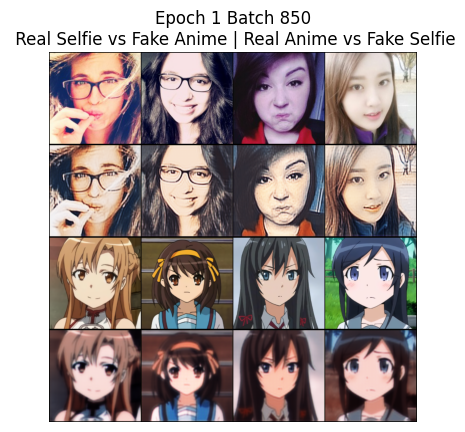

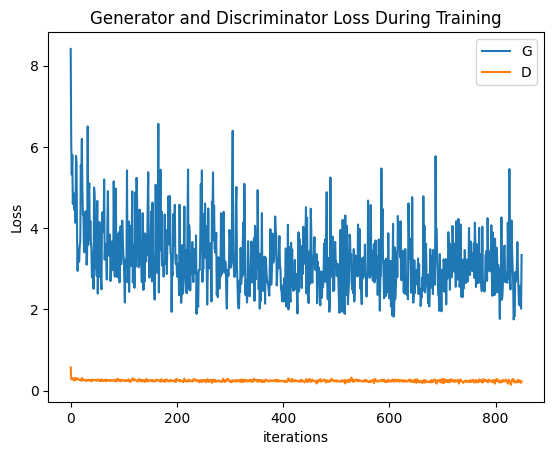

[Epoch: 1/10] [Batch: 850/3400] [D loss: 0.2233] [G loss: 3.3377 - (adv: 0.3268, cycle: 0.1210, identity: 0.1180)]
Models Saved


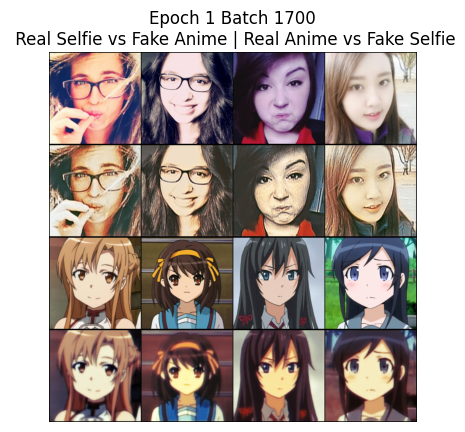

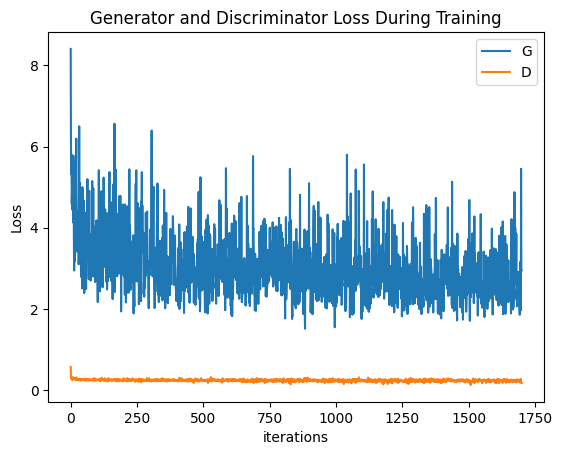

[Epoch: 1/10] [Batch: 1700/3400] [D loss: 0.1730] [G loss: 2.9457 - (adv: 0.3776, cycle: 0.1033, identity: 0.1003)]
Models Saved


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


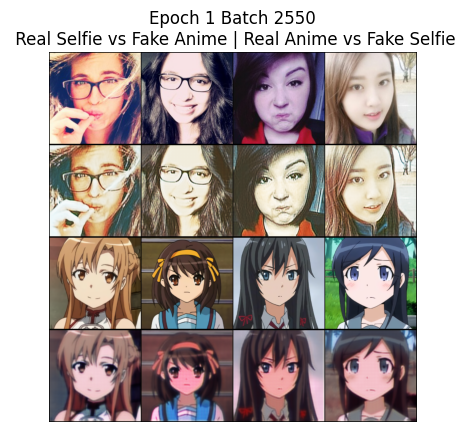

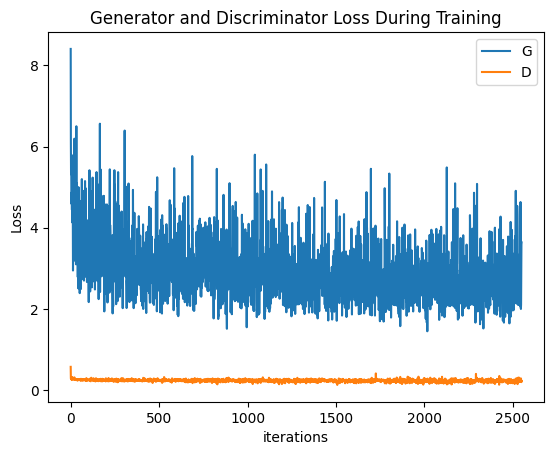

[Epoch: 1/10] [Batch: 2550/3400] [D loss: 0.2252] [G loss: 3.6395 - (adv: 0.3233, cycle: 0.1377, identity: 0.1126)]


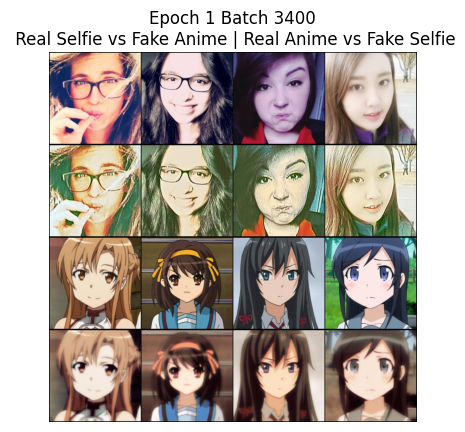

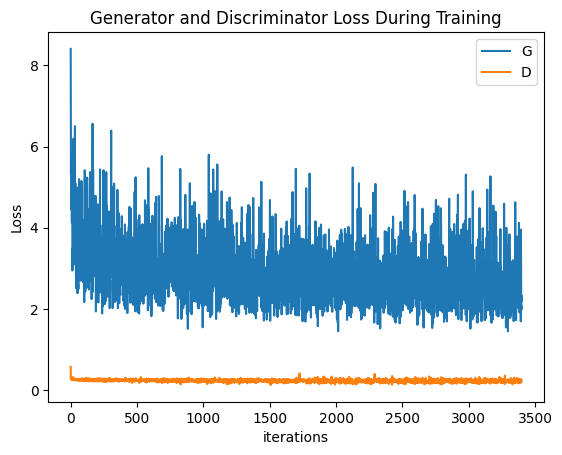

[Epoch: 1/10] [Batch: 3400/3400] [D loss: 0.2466] [G loss: 2.0427 - (adv: 0.2731, cycle: 0.0698, identity: 0.0746)]
Models Saved


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


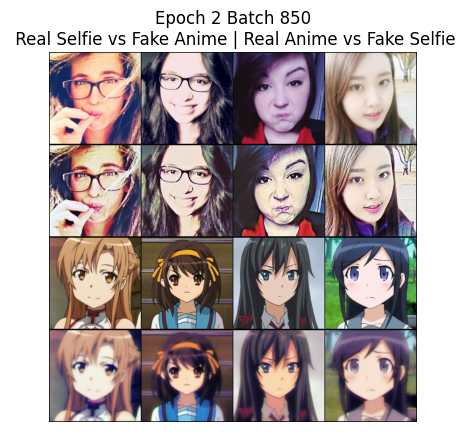

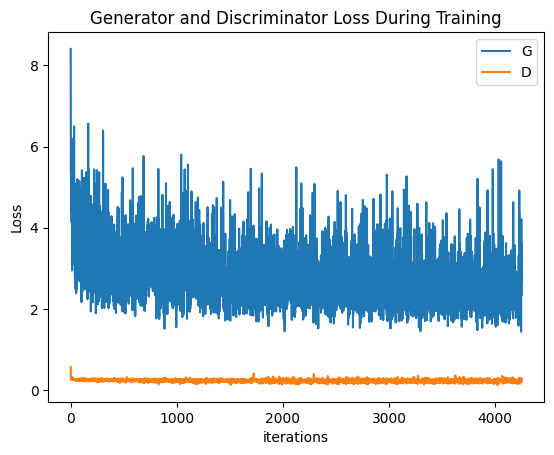

[Epoch: 2/10] [Batch: 850/3400] [D loss: 0.2840] [G loss: 2.3443 - (adv: 0.2714, cycle: 0.0838, identity: 0.0793)]
Models Saved


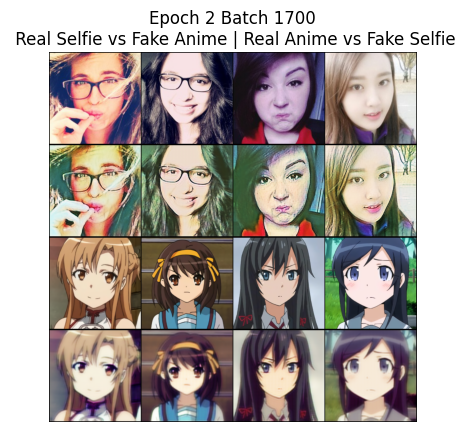

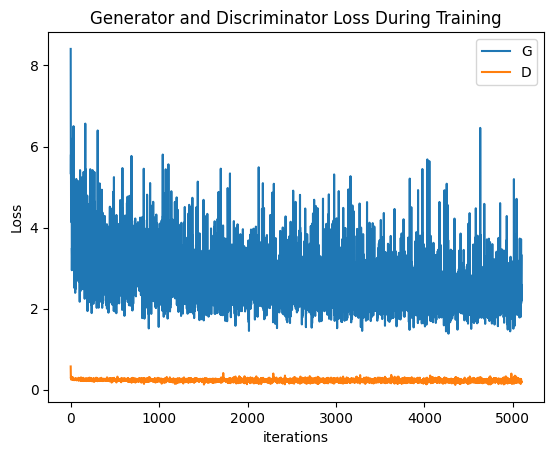

[Epoch: 2/10] [Batch: 1700/3400] [D loss: 0.1911] [G loss: 3.3099 - (adv: 0.2606, cycle: 0.1234, identity: 0.1164)]
Models Saved
Models Saved


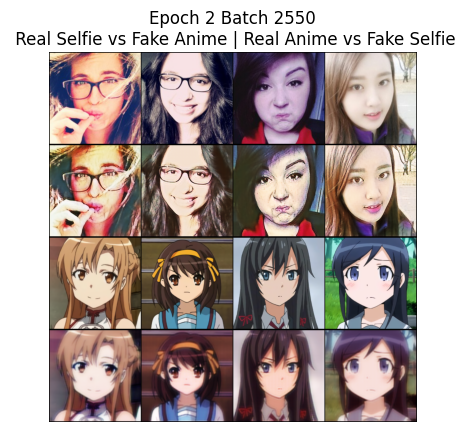

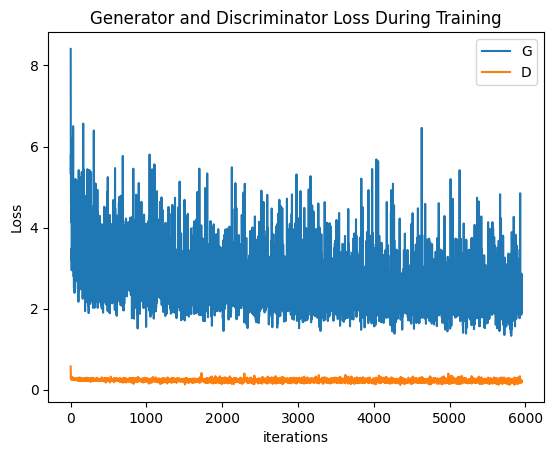

[Epoch: 2/10] [Batch: 2550/3400] [D loss: 0.1866] [G loss: 2.2036 - (adv: 0.4245, cycle: 0.0727, identity: 0.0652)]


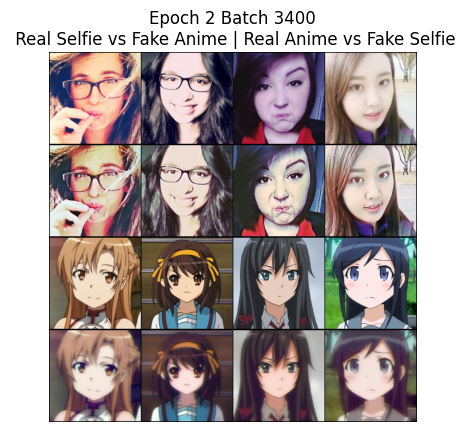

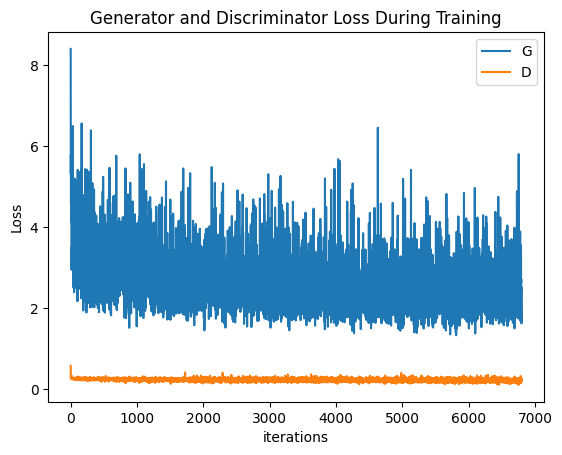

[Epoch: 2/10] [Batch: 3400/3400] [D loss: 0.2126] [G loss: 2.4258 - (adv: 0.2731, cycle: 0.0865, identity: 0.0844)]
Models Saved
Models Saved


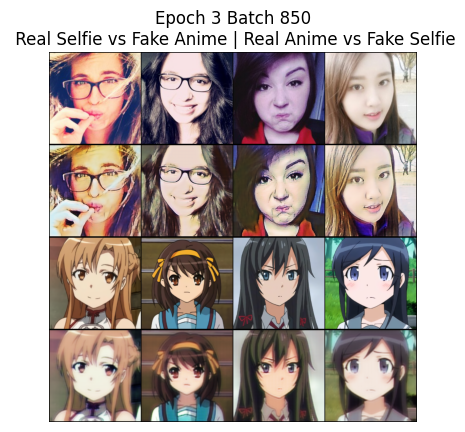

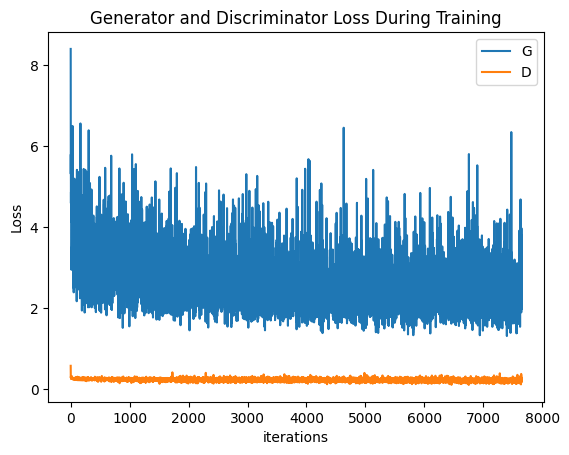

[Epoch: 3/10] [Batch: 850/3400] [D loss: 0.2366] [G loss: 1.9804 - (adv: 0.3057, cycle: 0.0676, identity: 0.0647)]


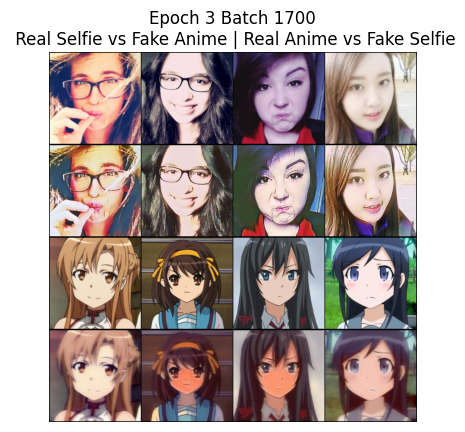

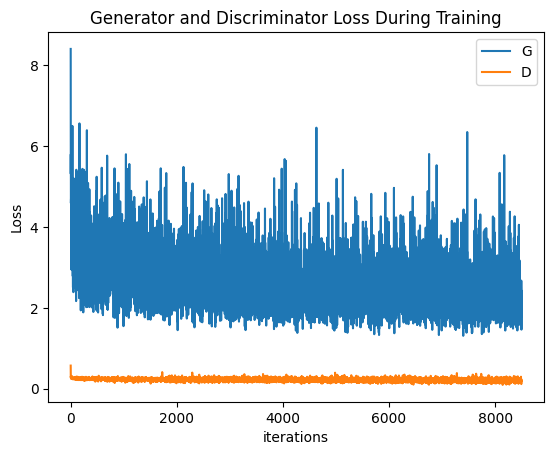

[Epoch: 3/10] [Batch: 1700/3400] [D loss: 0.1845] [G loss: 2.1822 - (adv: 0.3806, cycle: 0.0723, identity: 0.0711)]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


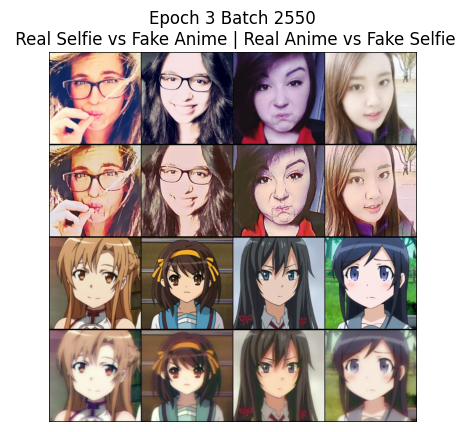

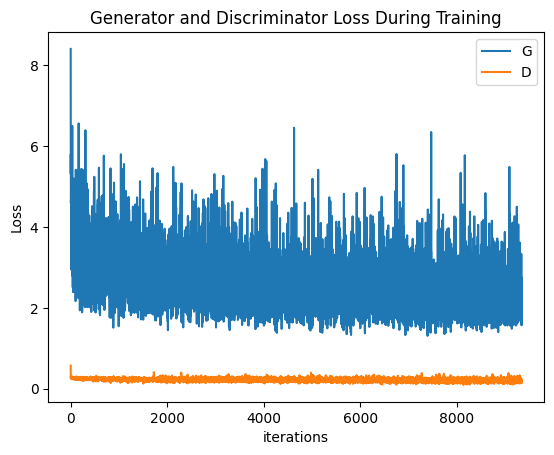

[Epoch: 3/10] [Batch: 2550/3400] [D loss: 0.1484] [G loss: 2.2317 - (adv: 0.3125, cycle: 0.0783, identity: 0.0708)]
Models Saved


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


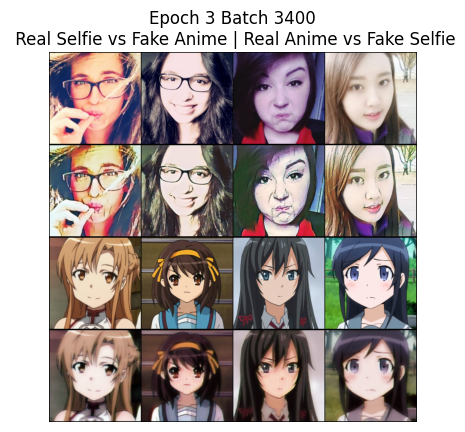

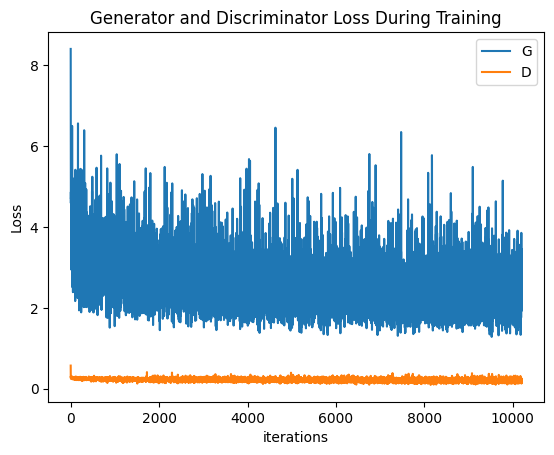

[Epoch: 3/10] [Batch: 3400/3400] [D loss: 0.2438] [G loss: 3.4498 - (adv: 0.4766, cycle: 0.1212, identity: 0.1099)]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


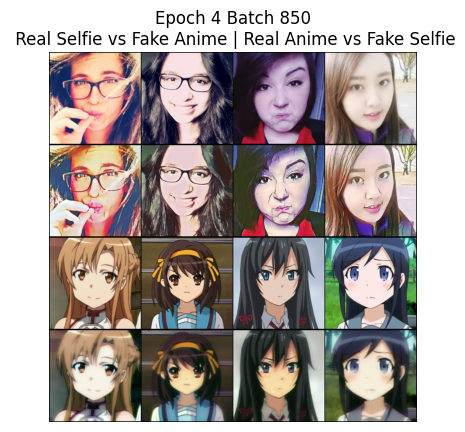

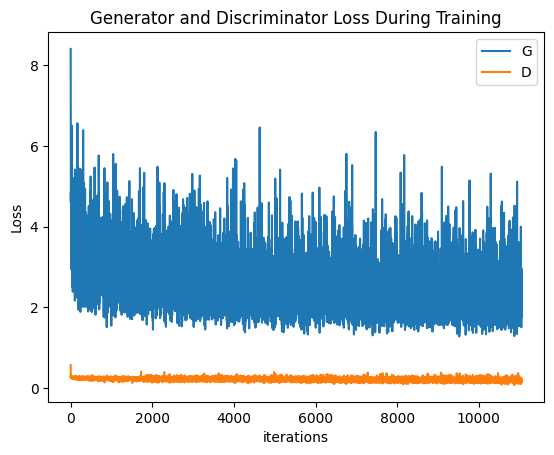

[Epoch: 4/10] [Batch: 850/3400] [D loss: 0.2250] [G loss: 2.5773 - (adv: 0.3399, cycle: 0.0916, identity: 0.0810)]
Models Saved


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


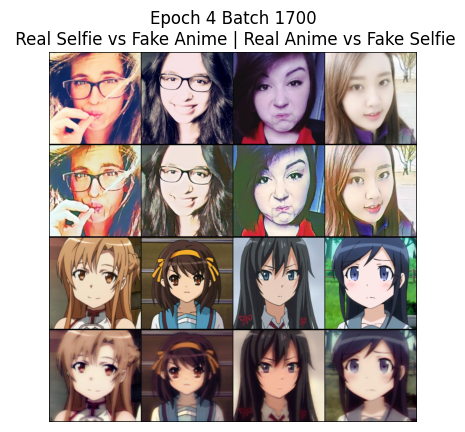

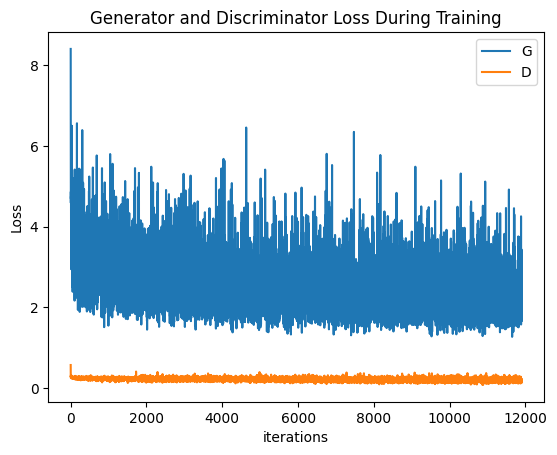

[Epoch: 4/10] [Batch: 1700/3400] [D loss: 0.1394] [G loss: 2.8475 - (adv: 0.4117, cycle: 0.1039, identity: 0.0716)]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


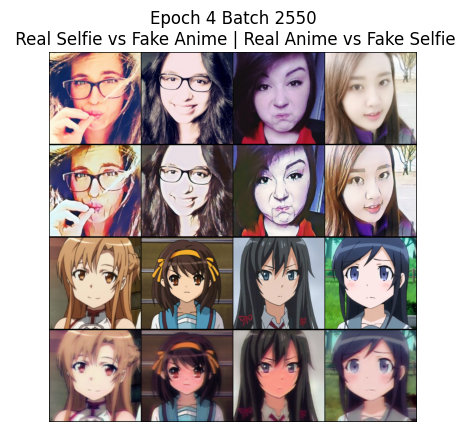

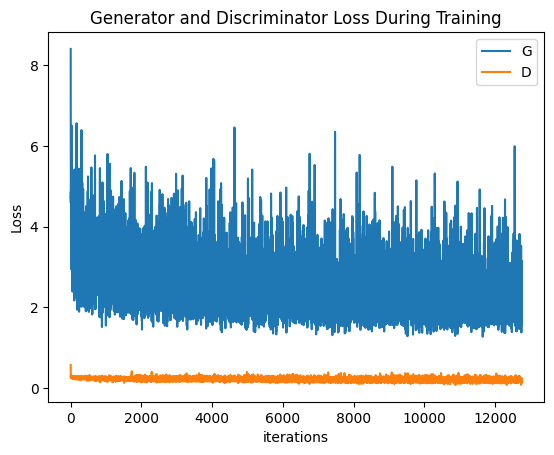

[Epoch: 4/10] [Batch: 2550/3400] [D loss: 0.2305] [G loss: 2.1860 - (adv: 0.3055, cycle: 0.0744, identity: 0.0786)]


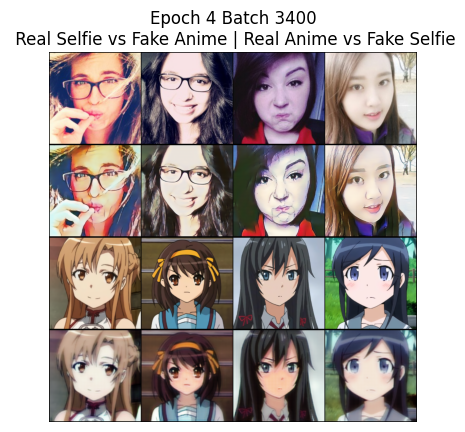

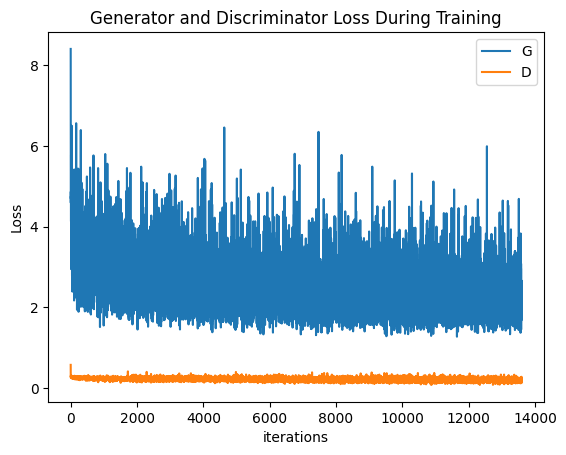

[Epoch: 4/10] [Batch: 3400/3400] [D loss: 0.2035] [G loss: 1.8236 - (adv: 0.4215, cycle: 0.0574, identity: 0.0509)]
Models Saved


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


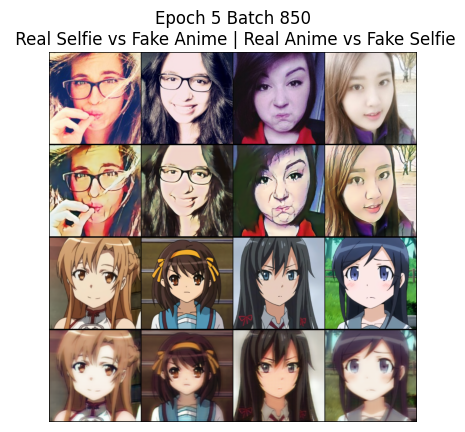

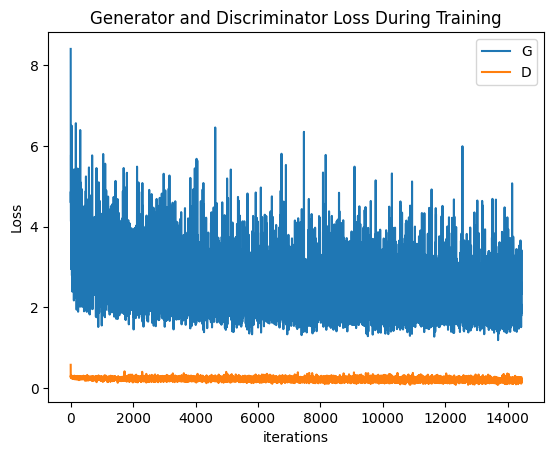

[Epoch: 5/10] [Batch: 850/3400] [D loss: 0.2515] [G loss: 2.3834 - (adv: 0.4374, cycle: 0.0775, identity: 0.0792)]
Models Saved


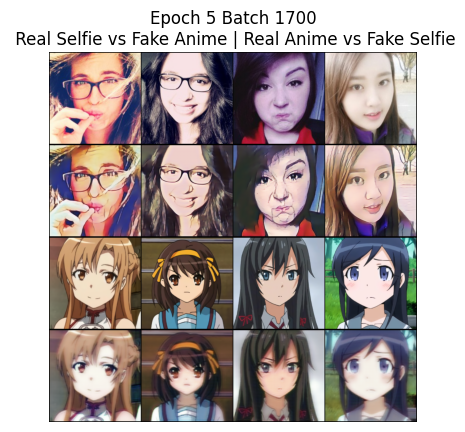

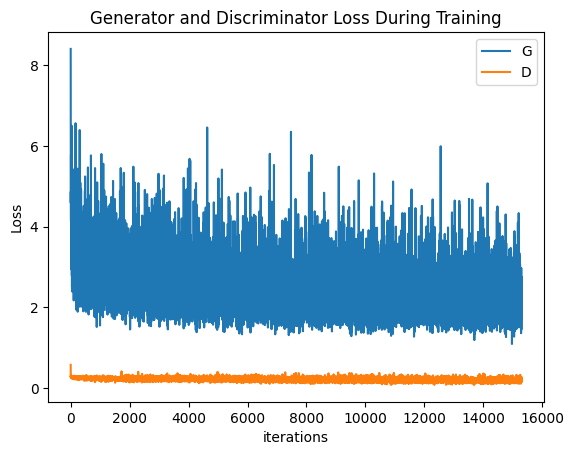

[Epoch: 5/10] [Batch: 1700/3400] [D loss: 0.1710] [G loss: 2.0179 - (adv: 0.3727, cycle: 0.0655, identity: 0.0672)]


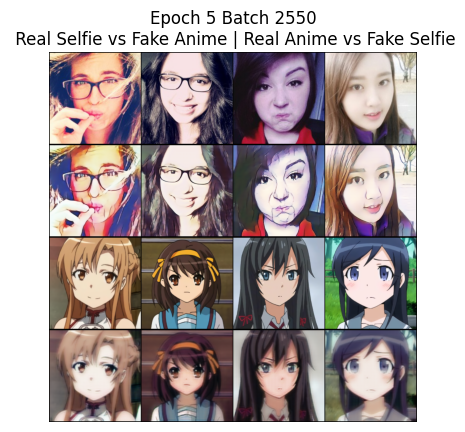

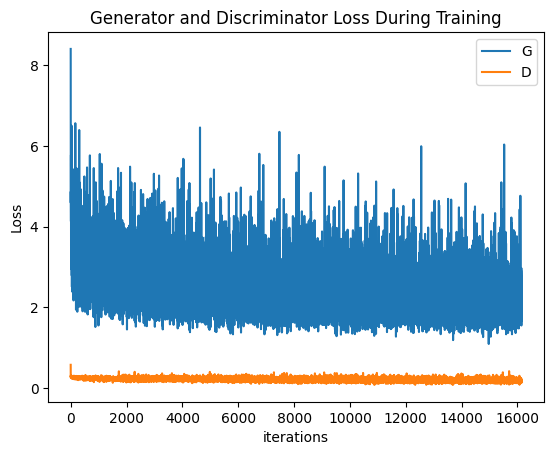

[Epoch: 5/10] [Batch: 2550/3400] [D loss: 0.1724] [G loss: 2.7538 - (adv: 0.4576, cycle: 0.0954, identity: 0.0775)]


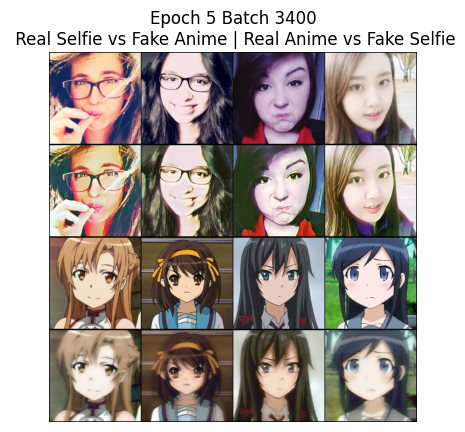

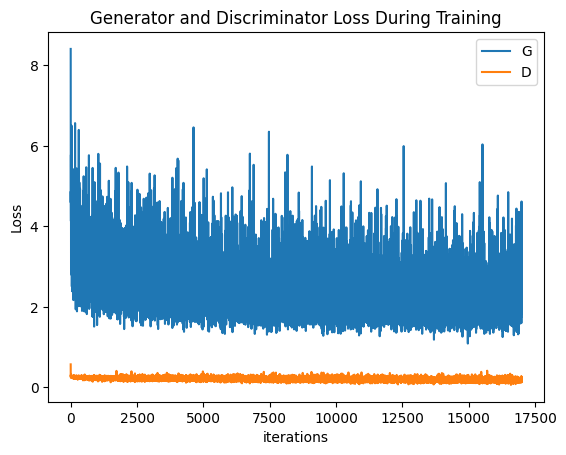

[Epoch: 5/10] [Batch: 3400/3400] [D loss: 0.2454] [G loss: 1.8276 - (adv: 0.3560, cycle: 0.0585, identity: 0.0602)]


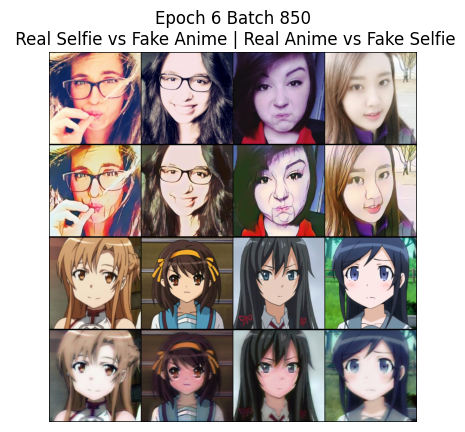

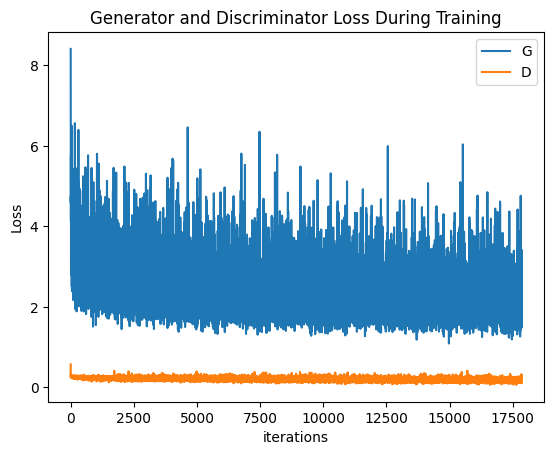

[Epoch: 6/10] [Batch: 850/3400] [D loss: 0.1617] [G loss: 1.5465 - (adv: 0.4924, cycle: 0.0398, identity: 0.0515)]


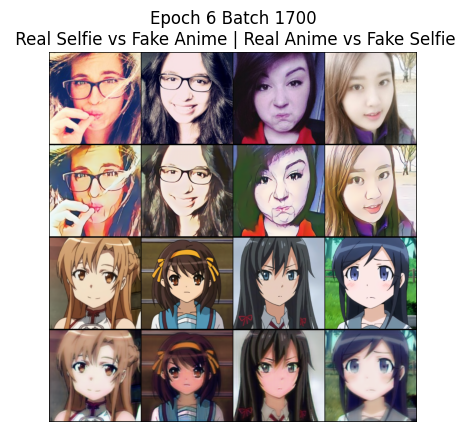

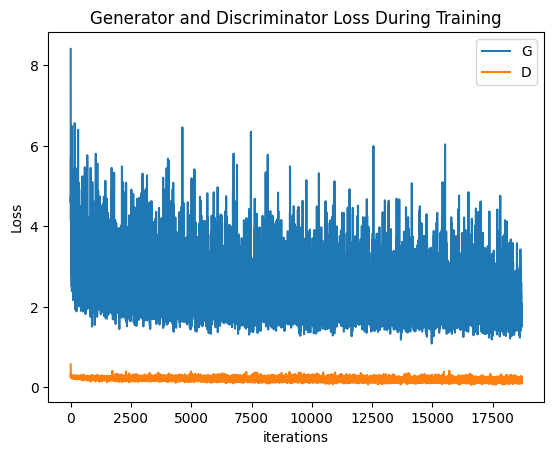

[Epoch: 6/10] [Batch: 1700/3400] [D loss: 0.2356] [G loss: 2.0304 - (adv: 0.2546, cycle: 0.0730, identity: 0.0631)]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


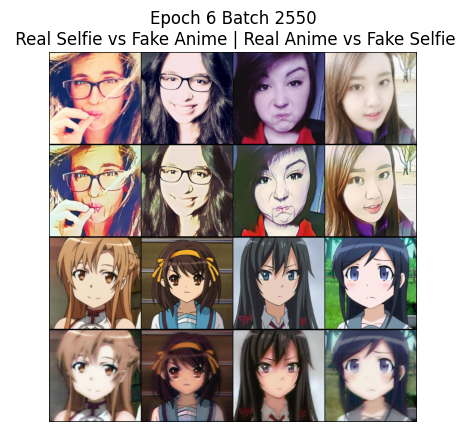

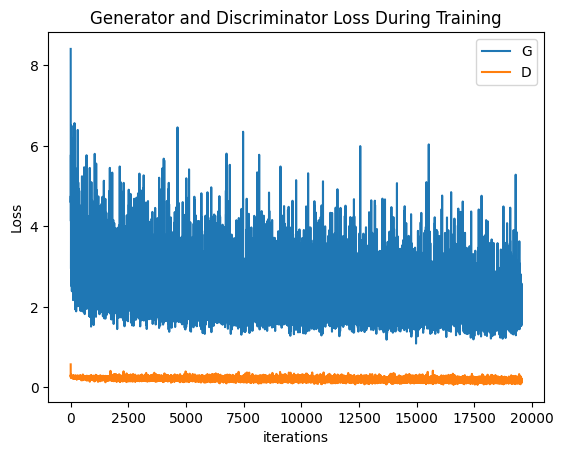

[Epoch: 6/10] [Batch: 2550/3400] [D loss: 0.1712] [G loss: 2.4319 - (adv: 0.4017, cycle: 0.0778, identity: 0.0950)]


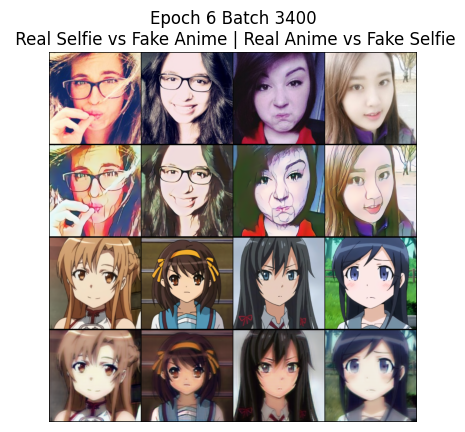

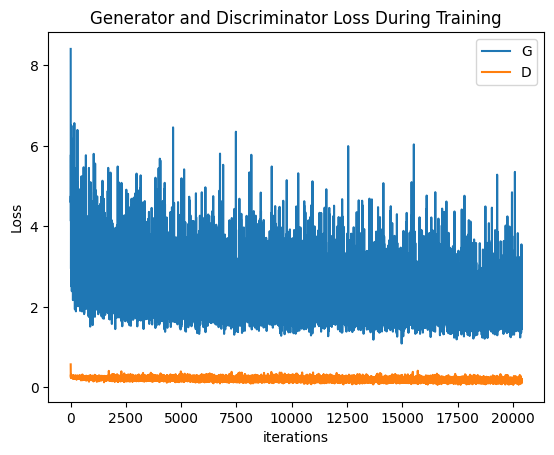

[Epoch: 6/10] [Batch: 3400/3400] [D loss: 0.1430] [G loss: 3.3999 - (adv: 0.5729, cycle: 0.1116, identity: 0.1190)]


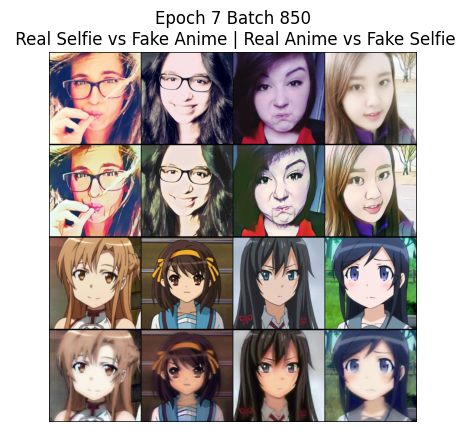

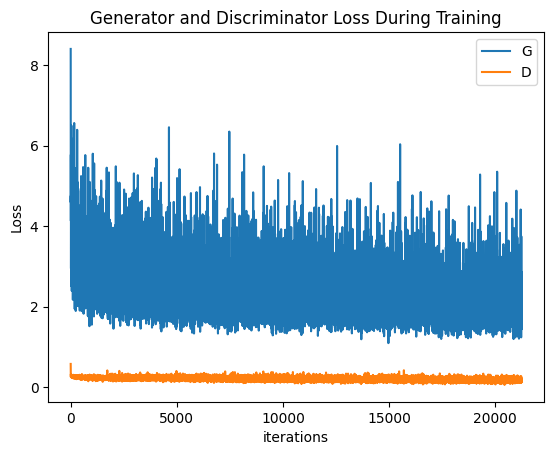

[Epoch: 7/10] [Batch: 850/3400] [D loss: 0.1988] [G loss: 2.8444 - (adv: 0.5539, cycle: 0.0912, identity: 0.0932)]


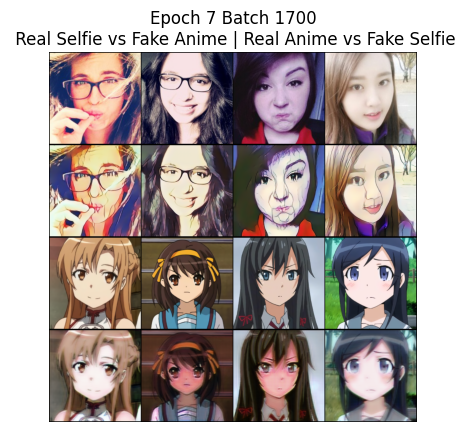

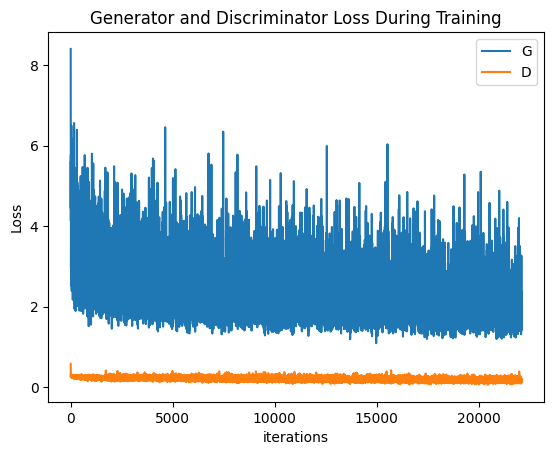

[Epoch: 7/10] [Batch: 1700/3400] [D loss: 0.1664] [G loss: 1.9058 - (adv: 0.4535, cycle: 0.0610, identity: 0.0466)]


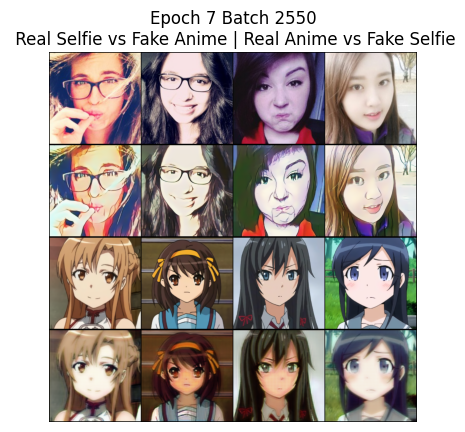

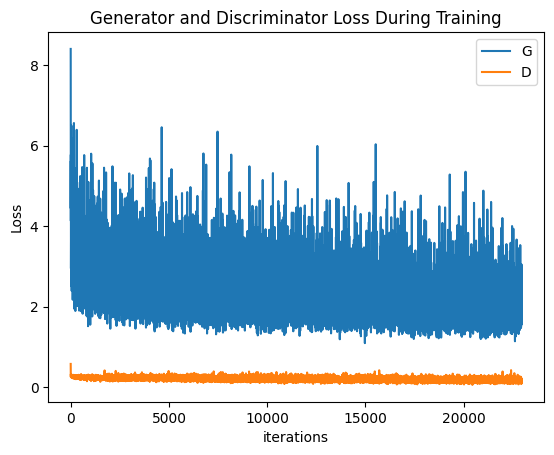

[Epoch: 7/10] [Batch: 2550/3400] [D loss: 0.0944] [G loss: 2.2389 - (adv: 0.6404, cycle: 0.0673, identity: 0.0507)]


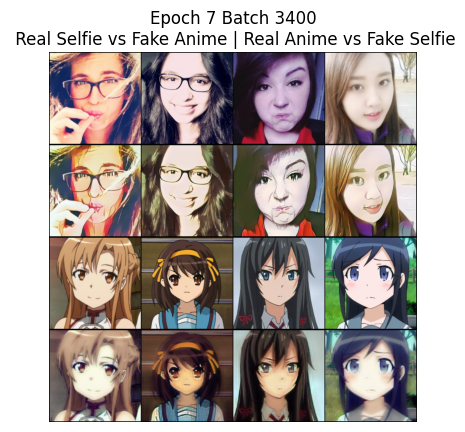

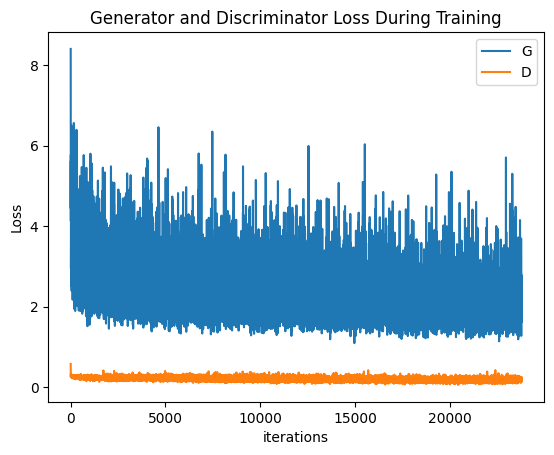

[Epoch: 7/10] [Batch: 3400/3400] [D loss: 0.1996] [G loss: 2.3842 - (adv: 0.4531, cycle: 0.0807, identity: 0.0635)]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


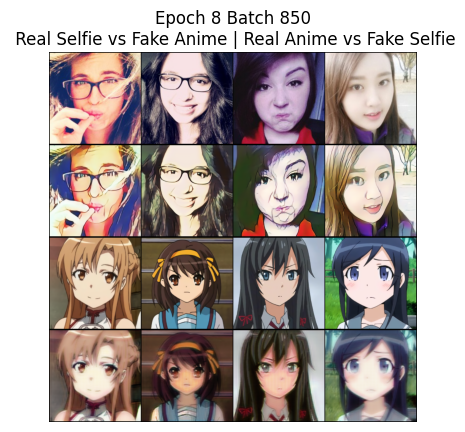

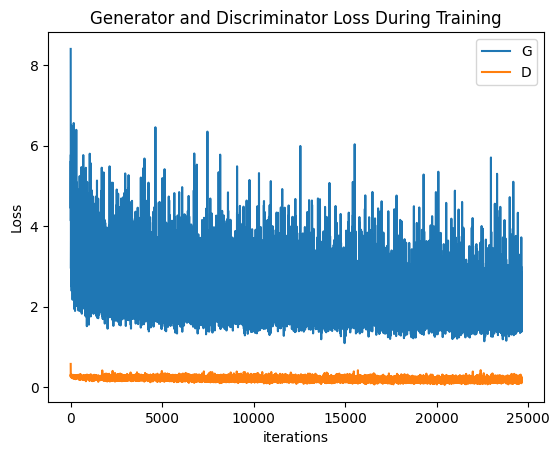

[Epoch: 8/10] [Batch: 850/3400] [D loss: 0.1739] [G loss: 2.0732 - (adv: 0.4970, cycle: 0.0597, identity: 0.0764)]


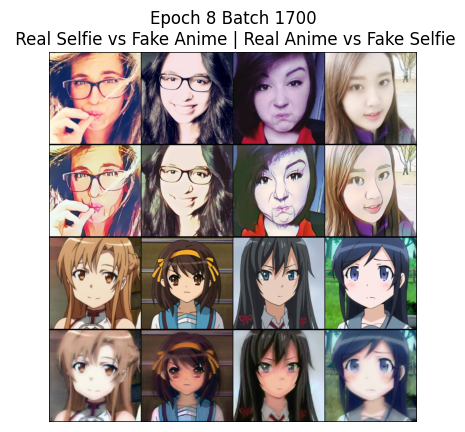

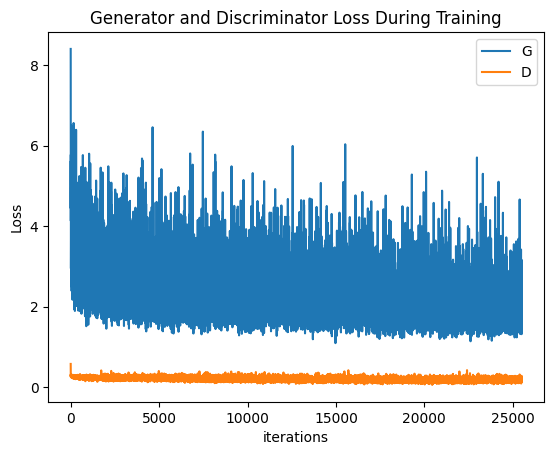

[Epoch: 8/10] [Batch: 1700/3400] [D loss: 0.1618] [G loss: 1.4136 - (adv: 0.4455, cycle: 0.0402, identity: 0.0330)]


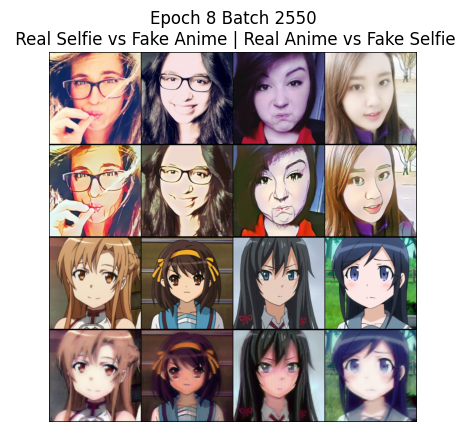

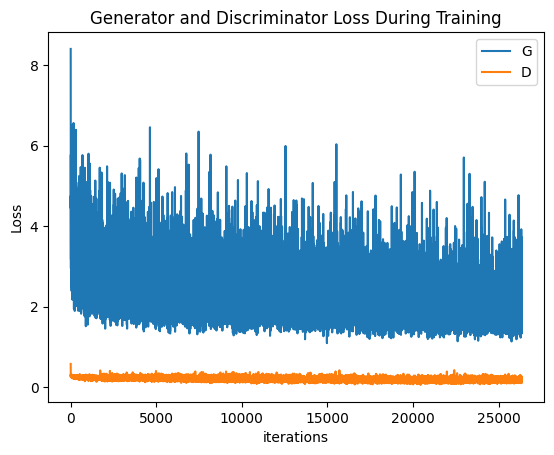

[Epoch: 8/10] [Batch: 2550/3400] [D loss: 0.1707] [G loss: 1.7152 - (adv: 0.4055, cycle: 0.0532, identity: 0.0492)]


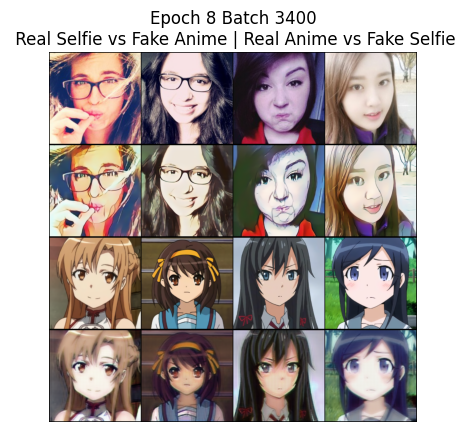

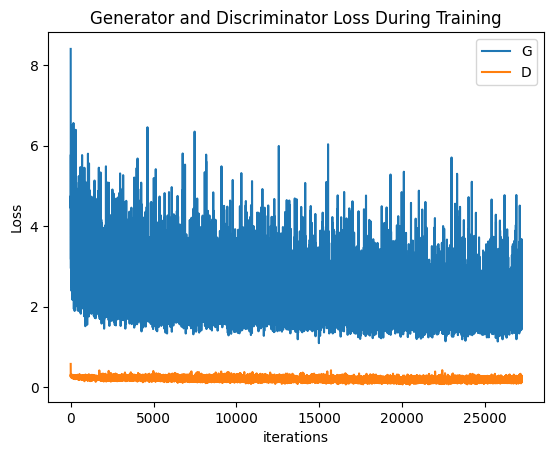

[Epoch: 8/10] [Batch: 3400/3400] [D loss: 0.2599] [G loss: 1.7269 - (adv: 0.4400, cycle: 0.0539, identity: 0.0418)]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


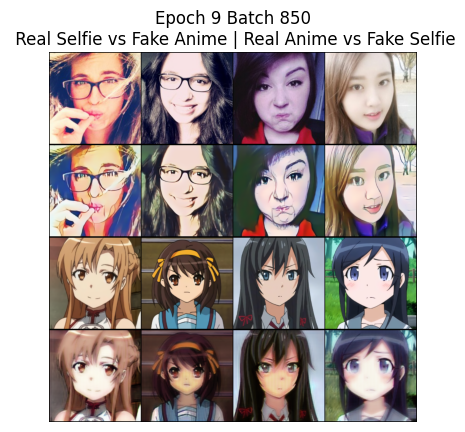

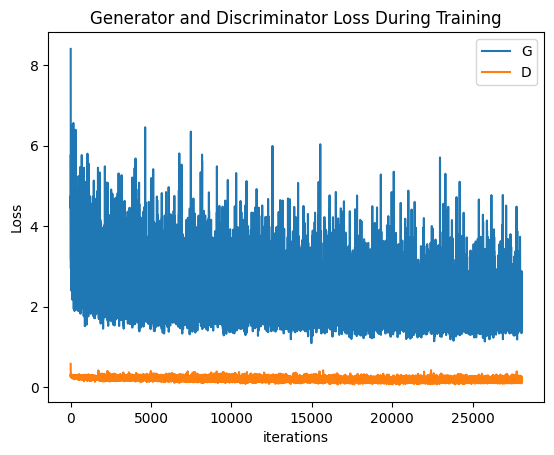

[Epoch: 9/10] [Batch: 850/3400] [D loss: 0.2056] [G loss: 1.8005 - (adv: 0.4462, cycle: 0.0526, identity: 0.0603)]


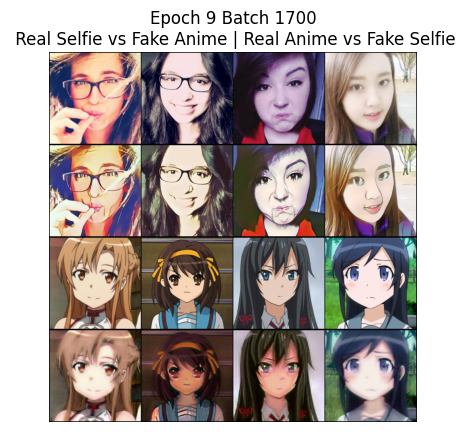

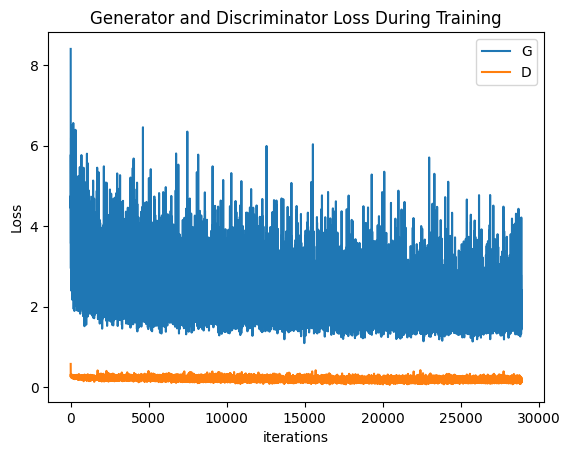

[Epoch: 9/10] [Batch: 1700/3400] [D loss: 0.1339] [G loss: 1.8983 - (adv: 0.4633, cycle: 0.0575, identity: 0.0572)]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


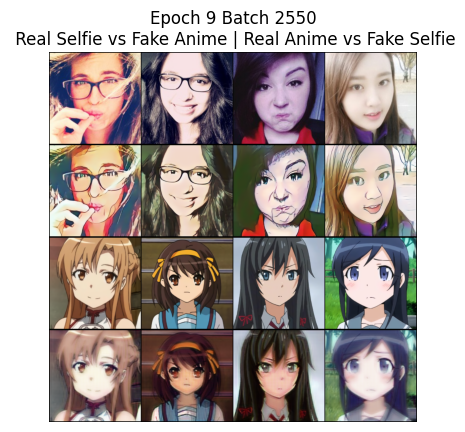

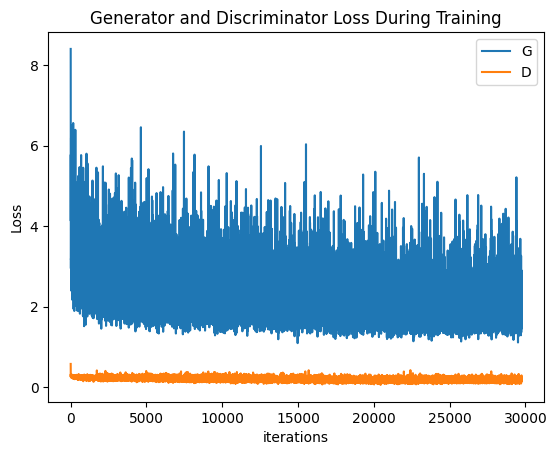

[Epoch: 9/10] [Batch: 2550/3400] [D loss: 0.1598] [G loss: 1.7561 - (adv: 0.4620, cycle: 0.0491, identity: 0.0624)]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


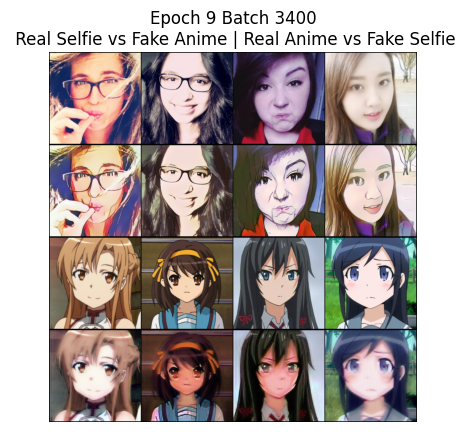

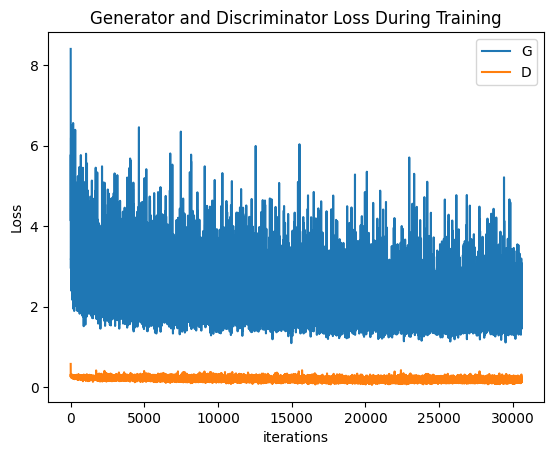

[Epoch: 9/10] [Batch: 3400/3400] [D loss: 0.1597] [G loss: 1.6642 - (adv: 0.4516, cycle: 0.0497, identity: 0.0436)]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


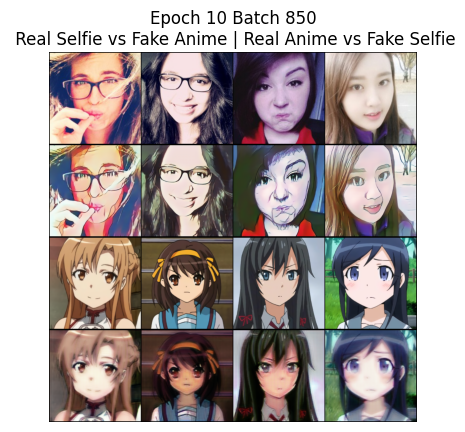

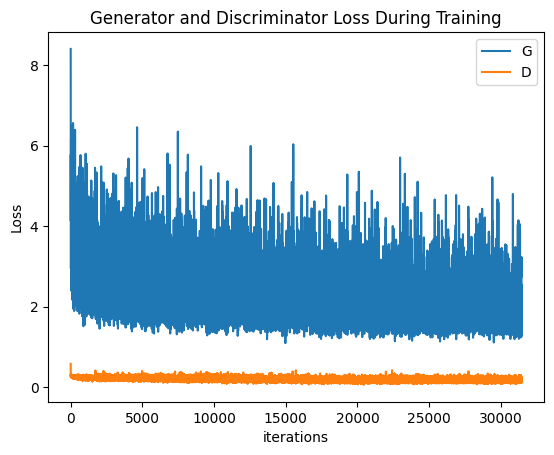

[Epoch: 10/10] [Batch: 850/3400] [D loss: 0.1169] [G loss: 2.7494 - (adv: 0.5409, cycle: 0.0920, identity: 0.0737)]


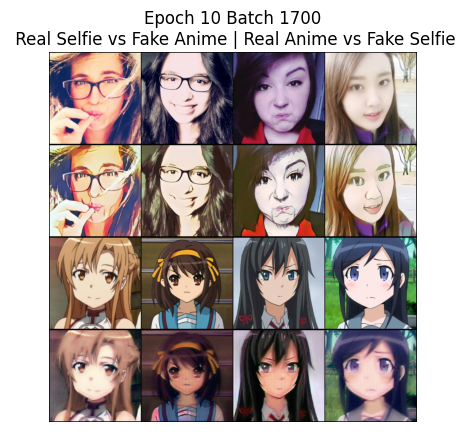

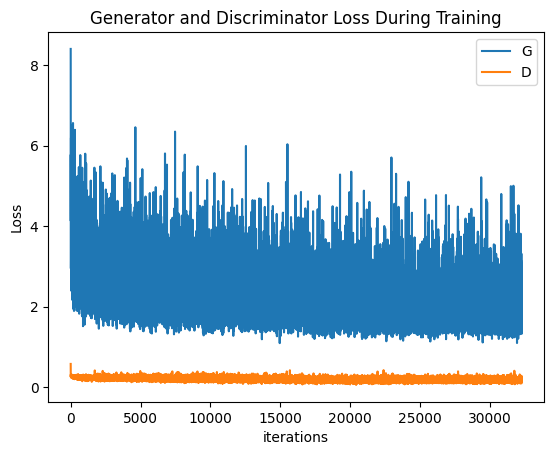

[Epoch: 10/10] [Batch: 1700/3400] [D loss: 0.2149] [G loss: 1.7618 - (adv: 0.4960, cycle: 0.0509, identity: 0.0496)]


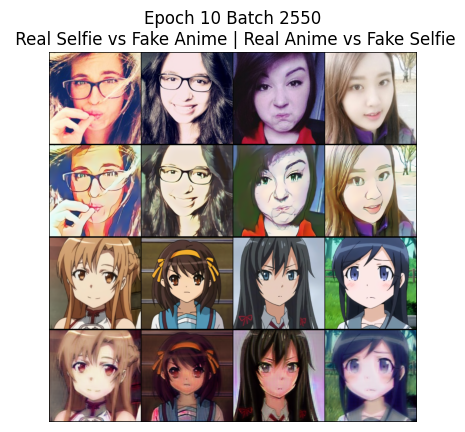

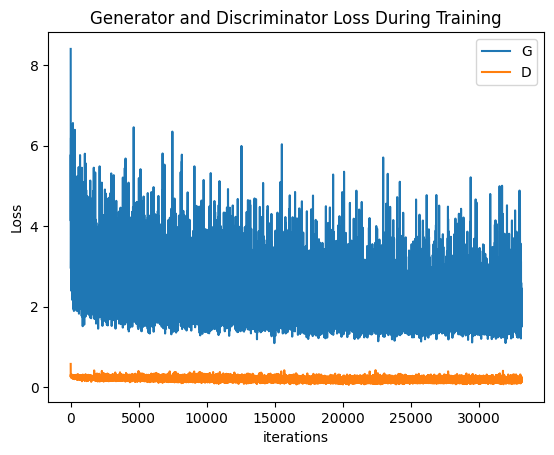

[Epoch: 10/10] [Batch: 2550/3400] [D loss: 0.1364] [G loss: 1.7797 - (adv: 0.4349, cycle: 0.0567, identity: 0.0423)]


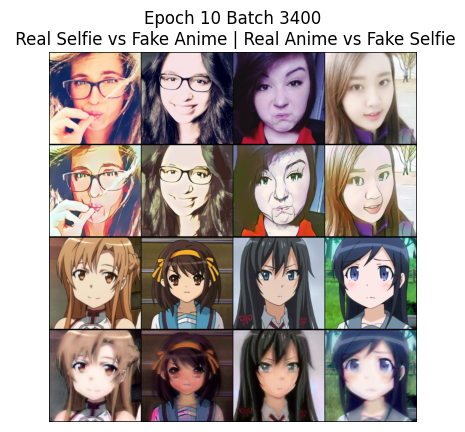

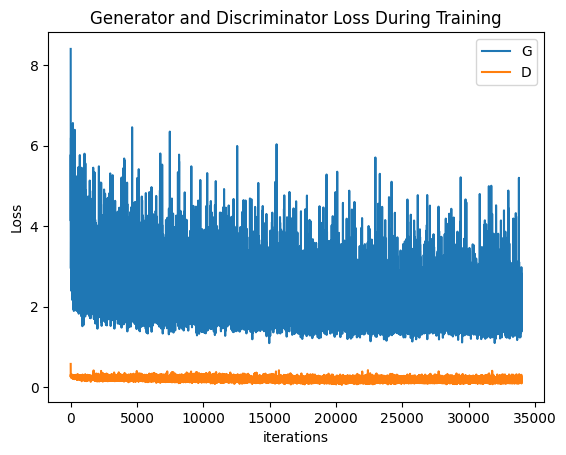

[Epoch: 10/10] [Batch: 3400/3400] [D loss: 0.1366] [G loss: 1.6799 - (adv: 0.5404, cycle: 0.0445, identity: 0.0501)]


In [18]:
# define model training
def train(train_A_loader, train_B_loader, G_AB, G_BA, D_A, D_B, scheduler_G, \
          scheduler_D_A, scheduler_D_B, n_epochs, batch_size, device):
    G_losses = []
    D_losses = []
    min_loss_G = np.Inf
    # plt.figure()

    for epoch in range(n_epochs):
        for i, (real_A, real_B) in enumerate(zip(train_A_loader, train_B_loader)):
            # A is selfie, B is anime 

            # Set model input
            real_A = real_A[0].to(device)
            real_B = real_B[0].to(device)
            
            discrim_output_shape = (batch_size,) + D_A.output_shape

            # Adversarial ground truths
            valid = torch.full(discrim_output_shape, 1, dtype = torch.float, device = device)
            fake = torch.full(discrim_output_shape, 0, dtype = torch.float, device = device)
            
            ####### --------------------------- Train Generators --------------------------- #######
            G_AB.train() # training
            G_BA.train() # training
            
            optimizer_G.zero_grad() # Integrated optimizer(G_AB, G_BA)
            
            # Identity Loss
            # regularize the generator to be near an identity mapping when real samples 
            # of the target domain are provided
            loss_id_A = criterion_identity(G_BA(real_A), real_A) 
            loss_id_B = criterion_identity(G_AB(real_B), real_B) 
                                                                
            loss_identity = (loss_id_A + loss_id_B)/2
            
            # GAN Loss for generated images (A -> B and B -> A)
            fake_B = G_AB(real_A) # fake_B is fake anime generated from selfie 
            loss_GAN_AB = criterion_GAN(D_B(fake_B), valid) # tricking the 'fake-B' into 'real-B'
            fake_A = G_BA(real_B)
            loss_GAN_BA = criterion_GAN(D_A(fake_A), valid) # tricking the 'fake-A' into 'real-A'
            
            loss_GAN = (loss_GAN_AB + loss_GAN_BA)/2
            
            # Cycle Loss for recovering images (A -> B -> A and B -> A -> B)
            reconstrcuted_A = G_BA(fake_B) 
            # reconstrcuted_A is fake selfie generated from fake anime generated from real selfie 
            loss_cycle_A = criterion_cycle(reconstrcuted_A, real_A) # Reduces the difference between the restored selfie and the real selfie
            reconstrcuted_B = G_AB(fake_A)
            loss_cycle_B = criterion_cycle(reconstrcuted_B, real_B)
            
            loss_cycle = (loss_cycle_A + loss_cycle_B)/2
            
            # Total generator loss
            loss_G = loss_GAN + (20 * loss_cycle) + (5 * loss_identity) 
            
            loss_G.backward()
            optimizer_G.step()
            
            ####### ------------------------- Train Discriminator A ------------------------- #######
            optimizer_D_A.zero_grad()
        
            loss_real = criterion_GAN(D_A(real_A), valid) # train to discriminate real images as real
            loss_fake = criterion_GAN(D_A(fake_A.detach()), fake) # train to discriminate fake images as fake
            
            loss_D_A = (loss_real + loss_fake)/2
            
            loss_D_A.backward()
            optimizer_D_A.step()

            ####### ------------------------- Train Discriminator B ------------------------- #######
            optimizer_D_B.zero_grad()
        
            loss_real = criterion_GAN(D_B(real_B), valid) # train to discriminate real images as real
            loss_fake = criterion_GAN(D_B(fake_B.detach()), fake) # train to discriminate fake images as fake
            
            loss_D_B = (loss_real + loss_fake)/2
            
            loss_D_B.backward()
            optimizer_D_B.step()
            
            # Total discriminator loss (for tracking)
            loss_D = (loss_D_A + loss_D_B)/2
        
            # Track losses
            G_losses.append(loss_G.item())
            D_losses.append(loss_D.item())

            # save model at min generator loss 
            if loss_G < min_loss_G:
                min_loss_G = loss_G
                
                torch.save(G_AB.state_dict(), "G_AB")
                torch.save(G_BA.state_dict(), "G_BA")
                torch.save(D_A.state_dict(), "D_A")
                torch.save(D_B.state_dict(), "D_B")
                print("Models Saved")

            ####### ------------------------ Show Training Progress ------------------------ #######
            if (i+1) % 850 == 0: # decrease output frequency for demo 
                show_sample_images(epoch+1, i+1)

                # plot losses so far
                plt.figure(2) # plt.clf()
                plt.axis('on')
                plt.title("Generator and Discriminator Loss During Training")
                plt.plot(G_losses,label="G")
                plt.plot(D_losses,label="D")
                plt.xlabel("iterations")
                plt.ylabel("Loss")
                plt.legend()
                plt.show()
                # plt.savefig("generator_discriminator_losses.png", dpi = 600)

                # save losses
                torch.save(G_losses, "G_losses")
                torch.save(D_losses, "D_losses")

                # print data
                print("[Epoch: {:d}/{:d}] [Batch: {:d}/{:d}] [D loss: {:.4f}] [G loss: {:.4f} - (adv: {:.4f}, cycle: {:.4f}, identity: {:.4f})]".format(
                        epoch+1,n_epochs,       # epoch
                        i+1,len(train_A_loader),   # batch
                        loss_D.item(),       # discriminator loss
                        loss_G.item(),       # generator loss (total)
                        loss_GAN.item(),     # GAN loss for generated images
                        loss_cycle.item(),   # cycle loss for recovered images
                        loss_identity.item(),# identity loss for real images
                        )
                     )
        
        # Update learning rate after each epoch
        scheduler_G.step()
        scheduler_D_A.step()
        scheduler_D_B.step()

    return G_losses, D_losses


# train the model
G_losses, D_losses = train(train_A_loader, train_B_loader, G_AB, G_BA, D_A, D_B, scheduler_G, \
                           scheduler_D_A, scheduler_D_B, n_epochs, batch_size, device)

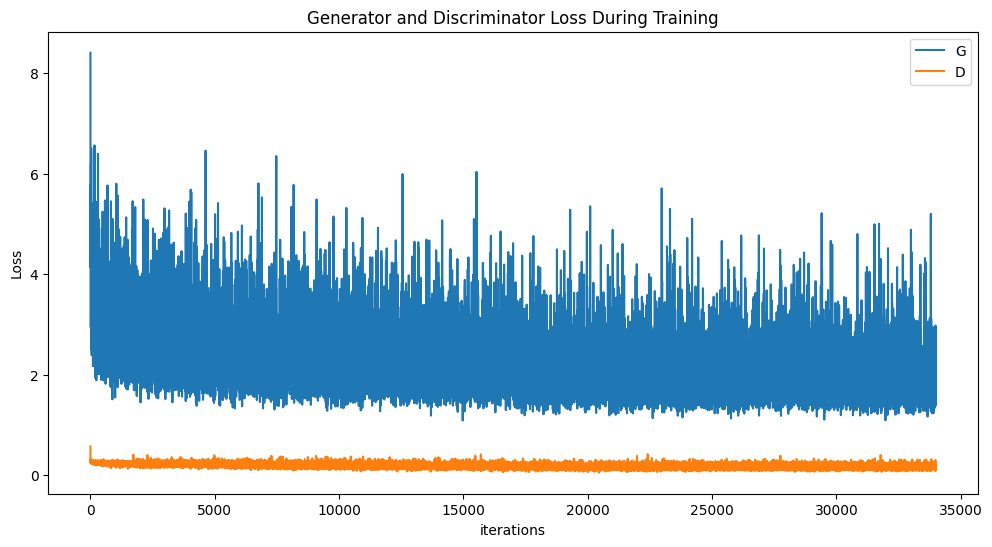

In [19]:
# # save final model
# torch.save(G_AB.state_dict(), "G_AB_final")
# torch.save(G_BA.state_dict(), "G_BA_final")
# torch.save(D_A.state_dict(), "D_A_final")
# torch.save(D_B.state_dict(), "D_B_final")

# # save losses
# torch.save(G_losses, "G_losses_final")
# torch.save(D_losses, "D_losses_final")

# # export model structure
# real_A = next(iter(train_A_loader))[0]
# real_B = next(iter(train_B_loader))[0]

# torch.onnx.export(G_AB.cpu(), real_A.cpu(), "G_AB.onnx", input_names=["Input noise vector"], output_names=["Generated Image"])
# torch.onnx.export(G_BA.cpu(), real_B.cpu(), "G_BA.onnx", input_names=["Input noise vector"], output_names=["Generated Image"])
# torch.onnx.export(D_A.cpu(), real_A.cpu(), "D_A.onnx", input_names=["Input image"], output_names=["Classification"])
# torch.onnx.export(D_B.cpu(), real_B[0].cpu(), "D_B.onnx", input_names=["Input image"], output_names=["Classification"])

# plot final results
plt.figure(figsize=(12,6))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
# plt.savefig("generator_discriminator_losses_final.png", dpi = 600)
plt.show()